In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 15.7 MB/s eta 0:00:00a 0:00:01


In [2]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
import random

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
model = YOLO('yolov8n.yaml').load('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 72.7MB/s]

Transferred 319/391 items from pretrained weights


In [4]:
result = model.train(
    data="/kaggle/input/vehicledetection/VehiclesDetectionDataset/dataset.yaml",
    epochs=200, 
    batch = 16, 
    lr0=0.000001
)

Ultralytics 8.3.13 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/input/vehicledetection/VehiclesDetectionDataset/dataset.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=yolov8n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

100%|██████████| 755k/755k [00:00<00:00, 13.9MB/s]
2024-10-15 12:54:20,856	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-15 12:54:21,707	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 65.6MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:03<00:00, 265.23it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:01<00:00, 200.90it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=1e-06' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      2.44G      1.028      3.162       1.37         52        640: 100%|██████████| 55/55 [00:12<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]

                   all        250        454     0.0338      0.858      0.167      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      2.39G      1.211      2.655      1.486         49        640: 100%|██████████| 55/55 [00:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]


                   all        250        454      0.791     0.0646      0.223      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      2.41G      1.236      2.469      1.508         57        640: 100%|██████████| 55/55 [00:09<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]


                   all        250        454      0.417      0.193      0.152     0.0893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      2.39G      1.283      2.381       1.52         64        640: 100%|██████████| 55/55 [00:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.60it/s]


                   all        250        454      0.311      0.231      0.225      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      2.38G      1.205       2.15       1.46         43        640: 100%|██████████| 55/55 [00:08<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]


                   all        250        454      0.242      0.337      0.256      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      2.43G      1.195      2.057      1.466         44        640: 100%|██████████| 55/55 [00:08<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]

                   all        250        454      0.365      0.325      0.275      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200       2.4G      1.174       2.02      1.467         63        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]


                   all        250        454      0.245      0.358      0.239      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      2.37G      1.179       1.91      1.447         41        640: 100%|██████████| 55/55 [00:08<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.39it/s]


                   all        250        454      0.374      0.379      0.295      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200       2.4G       1.14      1.844      1.421         58        640: 100%|██████████| 55/55 [00:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]


                   all        250        454      0.496       0.43      0.434       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      2.41G      1.127       1.73      1.414         64        640: 100%|██████████| 55/55 [00:08<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]

                   all        250        454      0.403      0.467      0.461      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      2.42G      1.123      1.722      1.409         40        640: 100%|██████████| 55/55 [00:09<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]


                   all        250        454      0.446      0.373      0.353       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      2.42G      1.107      1.611      1.382         64        640: 100%|██████████| 55/55 [00:08<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]


                   all        250        454      0.442      0.468       0.42      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      2.38G      1.075      1.566      1.375         55        640: 100%|██████████| 55/55 [00:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]


                   all        250        454       0.51      0.477      0.451      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      2.43G      1.091      1.564      1.393         34        640: 100%|██████████| 55/55 [00:09<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]


                   all        250        454      0.475      0.444      0.387      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      2.41G      1.063      1.512      1.342         59        640: 100%|██████████| 55/55 [00:09<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]

                   all        250        454      0.637      0.586      0.597      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      2.41G      1.053      1.442      1.346         38        640: 100%|██████████| 55/55 [00:08<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]


                   all        250        454      0.535      0.431      0.492      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200       2.4G      1.047       1.49       1.36         62        640: 100%|██████████| 55/55 [00:09<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]

                   all        250        454      0.497       0.49      0.493      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200       2.4G      1.023      1.376       1.32         68        640: 100%|██████████| 55/55 [00:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        250        454       0.54      0.437      0.455       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      2.41G      1.007      1.311      1.307         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]

                   all        250        454      0.406      0.541      0.475      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      2.41G      1.041      1.365      1.332         56        640: 100%|██████████| 55/55 [00:08<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]

                   all        250        454      0.511      0.583      0.514      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      2.38G     0.9818      1.303      1.303         66        640: 100%|██████████| 55/55 [00:08<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]

                   all        250        454      0.567       0.43      0.477      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      2.42G      0.983      1.237        1.3         41        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.42it/s]

                   all        250        454      0.542      0.455      0.477      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200       2.4G     0.9629       1.24      1.306         50        640: 100%|██████████| 55/55 [00:08<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]


                   all        250        454      0.616      0.438      0.464      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      2.41G      0.971      1.203      1.289         62        640: 100%|██████████| 55/55 [00:09<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.539       0.41       0.47      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200       2.4G      0.969      1.179      1.295         49        640: 100%|██████████| 55/55 [00:09<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]

                   all        250        454       0.57      0.501      0.488      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200       2.4G     0.9483      1.156      1.276         51        640: 100%|██████████| 55/55 [00:08<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        250        454      0.605      0.475      0.519      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200       2.4G     0.9346      1.158      1.278         32        640: 100%|██████████| 55/55 [00:08<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]


                   all        250        454        0.6      0.505       0.54       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      2.42G     0.9328      1.137      1.269         36        640: 100%|██████████| 55/55 [00:09<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]


                   all        250        454      0.472      0.527      0.459      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      2.38G     0.9209      1.097      1.245         44        640: 100%|██████████| 55/55 [00:08<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.07it/s]

                   all        250        454      0.614      0.579      0.554      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      2.41G     0.9051      1.062      1.248         50        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.92it/s]

                   all        250        454      0.631       0.53      0.557      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200       2.4G      0.909      1.031      1.246         60        640: 100%|██████████| 55/55 [00:09<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        250        454      0.542      0.507      0.517      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      2.39G      0.901      1.019      1.239         46        640: 100%|██████████| 55/55 [00:08<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]

                   all        250        454      0.598      0.489       0.45      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      2.42G     0.9072      1.017      1.229         52        640: 100%|██████████| 55/55 [00:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.594      0.431      0.478      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.42G     0.9045      1.018      1.234         51        640: 100%|██████████| 55/55 [00:08<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.99it/s]

                   all        250        454      0.519      0.556      0.526      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200       2.4G     0.8761     0.9732      1.207         46        640: 100%|██████████| 55/55 [00:08<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.01it/s]

                   all        250        454       0.54      0.603      0.558      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      2.41G     0.8728     0.9722       1.22         48        640: 100%|██████████| 55/55 [00:08<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.605       0.56       0.53      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200       2.4G     0.8719     0.9653       1.22         58        640: 100%|██████████| 55/55 [00:08<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]


                   all        250        454      0.542      0.504      0.534      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200       2.4G     0.8505     0.9747      1.193         40        640: 100%|██████████| 55/55 [00:08<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.15it/s]

                   all        250        454      0.543      0.488      0.482      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200       2.4G     0.8541     0.9657      1.211         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.33it/s]


                   all        250        454      0.513      0.562      0.516      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      2.41G     0.8415     0.9207      1.201         63        640: 100%|██████████| 55/55 [00:08<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.92it/s]

                   all        250        454      0.593      0.576      0.539       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      2.38G     0.8314     0.9165       1.19         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]

                   all        250        454      0.673      0.482      0.544      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200       2.4G     0.8276     0.8799      1.177         43        640: 100%|██████████| 55/55 [00:08<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]

                   all        250        454      0.591      0.513      0.532      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      2.43G     0.8187      0.879      1.186         50        640: 100%|██████████| 55/55 [00:08<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        250        454      0.582      0.508      0.494      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      2.39G     0.8179     0.8976      1.187         53        640: 100%|██████████| 55/55 [00:08<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.572      0.513      0.497      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200       2.4G     0.8065     0.8504      1.169         39        640: 100%|██████████| 55/55 [00:08<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.647      0.504       0.55      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200       2.4G      0.821     0.8594      1.172         56        640: 100%|██████████| 55/55 [00:08<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]

                   all        250        454      0.634      0.491      0.515      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      2.43G     0.8058     0.8801      1.181         40        640: 100%|██████████| 55/55 [00:08<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]


                   all        250        454      0.677      0.535      0.557      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      2.39G     0.8157     0.8604      1.177         66        640: 100%|██████████| 55/55 [00:09<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        250        454      0.483      0.512      0.468      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200       2.4G     0.7697     0.8199      1.149         55        640: 100%|██████████| 55/55 [00:08<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]

                   all        250        454      0.632       0.53      0.555      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      2.42G      0.792     0.8206      1.155         45        640: 100%|██████████| 55/55 [00:08<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]


                   all        250        454       0.64      0.497      0.499      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      2.38G     0.7583     0.7997      1.146         39        640: 100%|██████████| 55/55 [00:08<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]

                   all        250        454      0.559      0.523      0.494      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      2.41G      0.787      0.838      1.151         59        640: 100%|██████████| 55/55 [00:08<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]

                   all        250        454      0.548      0.544      0.503      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200       2.4G     0.7469     0.7936      1.131         61        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]


                   all        250        454      0.643      0.492      0.525      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      2.43G      0.747     0.7915      1.139         56        640: 100%|██████████| 55/55 [00:09<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]

                   all        250        454      0.468      0.525      0.482      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200       2.4G     0.7542      0.786      1.137         49        640: 100%|██████████| 55/55 [00:08<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.04it/s]

                   all        250        454      0.541      0.543      0.559      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      2.39G     0.7618     0.7853      1.133         60        640: 100%|██████████| 55/55 [00:08<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]

                   all        250        454      0.686      0.529      0.559      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      2.38G     0.7279     0.7717      1.125         52        640: 100%|██████████| 55/55 [00:09<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]


                   all        250        454       0.63      0.505      0.552      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200       2.4G     0.7293     0.7629      1.128         59        640: 100%|██████████| 55/55 [00:08<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]


                   all        250        454      0.526      0.523      0.499      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      2.42G     0.7312     0.7684      1.127         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]

                   all        250        454      0.635      0.516       0.55      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      2.42G     0.7196     0.7138      1.118         48        640: 100%|██████████| 55/55 [00:08<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        250        454      0.521      0.536      0.507      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200       2.4G     0.7475     0.7423      1.122         43        640: 100%|██████████| 55/55 [00:09<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.62it/s]


                   all        250        454      0.655       0.44      0.483      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      2.43G     0.7287     0.7414      1.121         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]

                   all        250        454      0.535      0.548      0.514      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      2.38G     0.7159     0.7108       1.12         50        640: 100%|██████████| 55/55 [00:09<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]

                   all        250        454      0.563      0.526      0.507      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      2.41G      0.726     0.7258      1.121         51        640: 100%|██████████| 55/55 [00:09<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]

                   all        250        454      0.543      0.516      0.522      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      2.41G     0.7028     0.7086      1.107         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]

                   all        250        454      0.566      0.559       0.53      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200       2.4G     0.7018     0.6976      1.105         55        640: 100%|██████████| 55/55 [00:09<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]


                   all        250        454      0.725      0.515      0.548      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200       2.4G     0.7156     0.7103      1.109         52        640: 100%|██████████| 55/55 [00:09<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]

                   all        250        454      0.526      0.571      0.546        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      2.41G     0.6867     0.6902      1.099         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]

                   all        250        454      0.611      0.528      0.517      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      2.42G     0.7057     0.6952      1.106         37        640: 100%|██████████| 55/55 [00:09<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]

                   all        250        454       0.54      0.552      0.517      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      2.41G     0.7034     0.6618      1.107         70        640: 100%|██████████| 55/55 [00:09<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.45it/s]

                   all        250        454      0.616      0.502      0.527       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      2.29G     0.6848     0.6679      1.095         54        640: 100%|██████████| 55/55 [00:09<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        250        454      0.674       0.53      0.528      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      2.39G     0.6595     0.6655      1.086         33        640: 100%|██████████| 55/55 [00:09<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]

                   all        250        454       0.59      0.461      0.492      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200       2.4G      0.685     0.6663      1.093         48        640: 100%|██████████| 55/55 [00:09<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.60it/s]

                   all        250        454      0.623      0.537      0.547        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200       2.4G     0.6762      0.646      1.093         40        640: 100%|██████████| 55/55 [00:09<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]


                   all        250        454      0.582      0.545      0.534      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      2.43G      0.678     0.6534      1.087         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        250        454      0.627      0.538      0.578      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      2.41G     0.6699     0.6555      1.084         64        640: 100%|██████████| 55/55 [00:09<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]


                   all        250        454      0.637      0.518      0.522      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200       2.4G      0.661     0.6446      1.087         45        640: 100%|██████████| 55/55 [00:09<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]

                   all        250        454      0.603      0.474      0.519      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200       2.4G     0.6559     0.6356       1.08         49        640: 100%|██████████| 55/55 [00:09<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.21it/s]

                   all        250        454      0.712      0.465      0.553      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      2.38G     0.6827     0.6597      1.093         55        640: 100%|██████████| 55/55 [00:09<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]

                   all        250        454      0.584      0.513      0.525      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      2.39G     0.6484      0.642      1.075         54        640: 100%|██████████| 55/55 [00:09<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        250        454      0.659       0.52      0.534      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      2.38G     0.6484     0.6127      1.075         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.73it/s]

                   all        250        454      0.683      0.499      0.553      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      2.41G     0.6525      0.616      1.076         44        640: 100%|██████████| 55/55 [00:09<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]

                   all        250        454      0.666      0.571      0.581      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      2.42G     0.6405     0.6277      1.059         66        640: 100%|██████████| 55/55 [00:09<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]

                   all        250        454      0.525      0.569       0.52      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      2.39G     0.6367     0.6118      1.065         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        250        454        0.6      0.465      0.513      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200       2.4G     0.6381     0.6172      1.066         82        640: 100%|██████████| 55/55 [00:08<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]

                   all        250        454      0.626      0.493       0.55      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      2.38G     0.6225     0.6139      1.058         54        640: 100%|██████████| 55/55 [00:09<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]

                   all        250        454      0.576      0.543      0.544      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200       2.4G     0.6401     0.6041      1.058         44        640: 100%|██████████| 55/55 [00:09<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]


                   all        250        454      0.681      0.488      0.546      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      2.41G     0.6228     0.5966      1.057         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]

                   all        250        454      0.596      0.523      0.573      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      2.43G      0.619     0.5946      1.065         57        640: 100%|██████████| 55/55 [00:09<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        250        454      0.637      0.522      0.542      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      2.43G      0.622     0.5842      1.053         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]

                   all        250        454       0.54      0.548      0.543      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      2.42G     0.6044     0.5916      1.047         59        640: 100%|██████████| 55/55 [00:09<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]


                   all        250        454      0.514      0.583      0.554      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      2.42G     0.6188     0.6012      1.059         45        640: 100%|██████████| 55/55 [00:09<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]

                   all        250        454      0.573      0.542      0.545      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200       2.4G     0.6362     0.6031      1.065         59        640: 100%|██████████| 55/55 [00:09<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]


                   all        250        454      0.762      0.476      0.555      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200       2.4G     0.6021     0.5704      1.046         52        640: 100%|██████████| 55/55 [00:09<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]

                   all        250        454      0.552      0.545      0.516      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      2.38G     0.6077     0.5658      1.047         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        250        454      0.598      0.539      0.548      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      2.39G     0.5962     0.5643      1.046         48        640: 100%|██████████| 55/55 [00:09<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]

                   all        250        454      0.706      0.518      0.579      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      2.38G     0.6085      0.557      1.042         56        640: 100%|██████████| 55/55 [00:09<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.15it/s]

                   all        250        454      0.598      0.558      0.574      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200       2.4G        0.6     0.5456      1.045         40        640: 100%|██████████| 55/55 [00:09<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]

                   all        250        454      0.617      0.458      0.509      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200       2.4G     0.6061     0.5728      1.055         52        640: 100%|██████████| 55/55 [00:09<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]


                   all        250        454      0.693       0.49      0.553      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      2.41G     0.5913     0.5433      1.034         47        640: 100%|██████████| 55/55 [00:09<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]

                   all        250        454      0.684      0.525      0.561      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      2.42G     0.5935     0.5499      1.043         38        640: 100%|██████████| 55/55 [00:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]

                   all        250        454      0.741      0.447      0.546      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      2.42G     0.5729     0.5385      1.036         49        640: 100%|██████████| 55/55 [00:09<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]


                   all        250        454      0.613      0.555      0.568       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      2.43G     0.5697     0.5284      1.034         61        640: 100%|██████████| 55/55 [00:09<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.02it/s]

                   all        250        454      0.688      0.551      0.586      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      2.39G     0.5805     0.5459      1.034         40        640: 100%|██████████| 55/55 [00:09<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]


                   all        250        454      0.554      0.542      0.537      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      2.42G     0.5675     0.5216      1.022         51        640: 100%|██████████| 55/55 [00:09<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.36it/s]

                   all        250        454       0.71      0.495      0.566      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      2.42G     0.5736      0.522       1.02         49        640: 100%|██████████| 55/55 [00:09<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]

                   all        250        454      0.675      0.494      0.543      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      2.42G     0.5739      0.522      1.024         36        640: 100%|██████████| 55/55 [00:09<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]

                   all        250        454      0.681      0.511      0.553      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      2.41G     0.5507      0.516      1.026         42        640: 100%|██████████| 55/55 [00:09<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]

                   all        250        454      0.546      0.552      0.527       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200       2.4G     0.5685     0.5234      1.021         67        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.653      0.451      0.494      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200       2.4G     0.5559     0.5051       1.01         57        640: 100%|██████████| 55/55 [00:09<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        250        454      0.584      0.502      0.512       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200       2.4G      0.554     0.5122      1.028         42        640: 100%|██████████| 55/55 [00:09<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]


                   all        250        454      0.671      0.472      0.537      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      2.39G     0.5495     0.5133      1.009         56        640: 100%|██████████| 55/55 [00:09<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        250        454      0.647       0.55      0.558      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      2.38G     0.5404     0.5094      1.009         46        640: 100%|██████████| 55/55 [00:09<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.68it/s]

                   all        250        454      0.626      0.584      0.577      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      2.43G     0.5574     0.5175      1.023         48        640: 100%|██████████| 55/55 [00:09<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]

                   all        250        454      0.659       0.56      0.581      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200       2.4G     0.5558     0.5127       1.03         55        640: 100%|██████████| 55/55 [00:09<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        250        454      0.698        0.5       0.57      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      2.41G     0.5449      0.502      1.002         67        640: 100%|██████████| 55/55 [00:09<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]

                   all        250        454      0.709      0.507      0.559      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      2.41G     0.5256     0.4838      1.002         48        640: 100%|██████████| 55/55 [00:09<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]

                   all        250        454      0.681      0.504      0.561      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200       2.4G     0.5401     0.4875      1.006         52        640: 100%|██████████| 55/55 [00:09<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]


                   all        250        454      0.658      0.537      0.567      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      2.38G     0.5343     0.4901     0.9992         43        640: 100%|██████████| 55/55 [00:09<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        250        454      0.682      0.515      0.582       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      2.41G     0.5393     0.5044      1.006         59        640: 100%|██████████| 55/55 [00:09<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        250        454      0.591      0.571      0.558       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200       2.4G      0.555     0.5029      1.011         64        640: 100%|██████████| 55/55 [00:09<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        250        454      0.681      0.521      0.544      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      2.38G     0.5261     0.4823      1.008         42        640: 100%|██████████| 55/55 [00:09<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]


                   all        250        454       0.62      0.562      0.577      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      2.42G     0.5313     0.4859      1.014         57        640: 100%|██████████| 55/55 [00:09<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]

                   all        250        454      0.683      0.557      0.582      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      2.39G     0.5292     0.4759      1.003         46        640: 100%|██████████| 55/55 [00:08<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]

                   all        250        454      0.652      0.542       0.56      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200       2.4G     0.5231     0.4643      1.006         50        640: 100%|██████████| 55/55 [00:09<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        250        454      0.582      0.559      0.563      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      2.38G     0.5112      0.472     0.9939         57        640: 100%|██████████| 55/55 [00:09<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]


                   all        250        454      0.558      0.558      0.564      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200       2.4G     0.5198     0.4859      1.001         44        640: 100%|██████████| 55/55 [00:09<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]

                   all        250        454      0.653      0.478      0.547      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      2.39G     0.5227     0.4688     0.9993         50        640: 100%|██████████| 55/55 [00:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.573      0.575      0.547      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      2.42G     0.5127     0.4611     0.9926         57        640: 100%|██████████| 55/55 [00:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.11it/s]

                   all        250        454      0.616      0.494       0.54      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200       2.4G     0.5105     0.4706      1.002         46        640: 100%|██████████| 55/55 [00:09<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.02it/s]

                   all        250        454      0.598      0.535      0.545      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200       2.4G     0.5053     0.4536      1.001         42        640: 100%|██████████| 55/55 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.05it/s]

                   all        250        454      0.665      0.545      0.576      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      2.42G     0.5125     0.4589     0.9925         60        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.13it/s]

                   all        250        454      0.576      0.546      0.557      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200       2.4G     0.5077     0.4628     0.9952         72        640: 100%|██████████| 55/55 [00:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.04it/s]

                   all        250        454      0.599      0.527      0.552      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200       2.4G     0.4856     0.4425     0.9881         51        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.19it/s]

                   all        250        454      0.622      0.494      0.538      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      2.42G     0.4953     0.4469     0.9906         59        640: 100%|██████████| 55/55 [00:08<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.628      0.475      0.526      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      2.41G     0.5081     0.4574     0.9922         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.07it/s]

                   all        250        454      0.663      0.475      0.555       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      2.41G     0.5106     0.4575     0.9962         44        640: 100%|██████████| 55/55 [00:08<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.29it/s]

                   all        250        454      0.581       0.55      0.546      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      2.42G     0.4937     0.4375     0.9822         88        640: 100%|██████████| 55/55 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454        0.6      0.494      0.534      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      2.42G     0.4928     0.4479     0.9856         36        640: 100%|██████████| 55/55 [00:08<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.14it/s]

                   all        250        454      0.631      0.498      0.541      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      2.41G     0.4896      0.439       0.98         56        640: 100%|██████████| 55/55 [00:08<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.08it/s]

                   all        250        454      0.592      0.545       0.56      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200       2.4G      0.498     0.4475     0.9865         66        640: 100%|██████████| 55/55 [00:08<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.99it/s]

                   all        250        454      0.651      0.498      0.561      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200       2.4G     0.4828     0.4521     0.9859         43        640: 100%|██████████| 55/55 [00:08<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.92it/s]

                   all        250        454      0.653      0.532      0.549      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      2.41G     0.4846     0.4408     0.9776         65        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.701      0.537      0.577      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      2.39G     0.4828      0.433     0.9849         70        640: 100%|██████████| 55/55 [00:08<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.36it/s]

                   all        250        454      0.635      0.509      0.552      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200       2.4G     0.4711     0.4206     0.9787         40        640: 100%|██████████| 55/55 [00:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]

                   all        250        454      0.636       0.53      0.566      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      2.41G     0.4885     0.4335     0.9884         39        640: 100%|██████████| 55/55 [00:08<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.20it/s]

                   all        250        454      0.651       0.49      0.549      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200       2.4G     0.4809     0.4282     0.9757         60        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]

                   all        250        454      0.646      0.496      0.553      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      2.41G      0.475     0.4219     0.9709         40        640: 100%|██████████| 55/55 [00:09<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.21it/s]

                   all        250        454      0.737      0.464      0.561      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200       2.4G     0.4796     0.4258      0.983         41        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.04it/s]

                   all        250        454      0.662      0.501      0.551      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      2.42G     0.4631     0.4113     0.9754         38        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.17it/s]

                   all        250        454      0.702      0.498      0.576      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      2.41G     0.4718     0.4281     0.9777         49        640: 100%|██████████| 55/55 [00:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.736      0.448      0.564      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      2.41G     0.4652      0.415     0.9733         43        640: 100%|██████████| 55/55 [00:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]

                   all        250        454      0.567      0.572      0.571      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      2.42G     0.4672     0.4213     0.9721         48        640: 100%|██████████| 55/55 [00:09<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]

                   all        250        454      0.603      0.525      0.553      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200       2.4G     0.4686     0.4165      0.969         65        640: 100%|██████████| 55/55 [00:09<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]

                   all        250        454      0.665      0.517      0.562      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200       2.4G     0.4603     0.4166     0.9679         31        640: 100%|██████████| 55/55 [00:09<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        250        454      0.581       0.54      0.576      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      2.41G     0.4651     0.4157     0.9683         54        640: 100%|██████████| 55/55 [00:09<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]


                   all        250        454      0.761       0.46      0.573      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200       2.4G     0.4641     0.4116     0.9683         39        640: 100%|██████████| 55/55 [00:09<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        250        454      0.709      0.501      0.578      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200       2.4G     0.4557     0.4002     0.9593         46        640: 100%|██████████| 55/55 [00:09<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]

                   all        250        454      0.653      0.549      0.579      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      2.43G     0.4453     0.3951       0.96         59        640: 100%|██████████| 55/55 [00:09<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.729       0.51      0.588      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      2.41G     0.4586     0.4176     0.9704         48        640: 100%|██████████| 55/55 [00:09<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        250        454      0.637      0.563      0.572      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      2.41G     0.4468     0.3931     0.9761         55        640: 100%|██████████| 55/55 [00:08<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]

                   all        250        454       0.73      0.514      0.576      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      2.42G     0.4539     0.3988     0.9682         57        640: 100%|██████████| 55/55 [00:09<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.68it/s]

                   all        250        454      0.665       0.51      0.577      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      2.42G     0.4612     0.4073     0.9676         51        640: 100%|██████████| 55/55 [00:09<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        250        454        0.7      0.488      0.569      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      2.39G     0.4354      0.395     0.9599         45        640: 100%|██████████| 55/55 [00:09<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.35it/s]


                   all        250        454      0.599      0.558      0.584      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200       2.4G      0.447     0.3868     0.9578         57        640: 100%|██████████| 55/55 [00:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        250        454      0.669      0.538      0.569      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200       2.4G     0.4387     0.3987     0.9597         52        640: 100%|██████████| 55/55 [00:08<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.05it/s]

                   all        250        454      0.719        0.5      0.564      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200       2.4G     0.4164      0.383     0.9573         40        640: 100%|██████████| 55/55 [00:09<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]

                   all        250        454        0.6       0.56      0.558      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      2.39G     0.4183     0.3802     0.9493         59        640: 100%|██████████| 55/55 [00:09<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]

                   all        250        454      0.632      0.491      0.546      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      2.42G     0.4292      0.385     0.9573         42        640: 100%|██████████| 55/55 [00:08<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]

                   all        250        454      0.624      0.525      0.555      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      2.42G     0.4269     0.3827     0.9491         55        640: 100%|██████████| 55/55 [00:09<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        250        454      0.643      0.528      0.559      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200       2.4G     0.4337     0.3923     0.9579         43        640: 100%|██████████| 55/55 [00:09<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]

                   all        250        454       0.65      0.488      0.549      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      2.39G     0.4166     0.3799     0.9561         46        640: 100%|██████████| 55/55 [00:08<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]

                   all        250        454      0.659      0.542      0.569      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      2.42G     0.4223     0.3827     0.9562         50        640: 100%|██████████| 55/55 [00:09<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]


                   all        250        454      0.602       0.53      0.551      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200       2.4G     0.4306     0.3825     0.9458         71        640: 100%|██████████| 55/55 [00:08<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]


                   all        250        454      0.567      0.545      0.553      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200       2.4G     0.4238      0.375     0.9516         35        640: 100%|██████████| 55/55 [00:08<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]

                   all        250        454      0.732      0.484      0.561      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      2.41G     0.4118     0.3626     0.9505         43        640: 100%|██████████| 55/55 [00:09<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]

                   all        250        454      0.642      0.534      0.569      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200       2.4G     0.4209     0.3803     0.9516         64        640: 100%|██████████| 55/55 [00:08<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]

                   all        250        454       0.63      0.544      0.566      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200       2.4G      0.423     0.3766     0.9514         44        640: 100%|██████████| 55/55 [00:09<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]

                   all        250        454      0.719      0.516      0.573      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200       2.4G     0.4068     0.3665     0.9492         40        640: 100%|██████████| 55/55 [00:08<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]

                   all        250        454      0.682      0.519      0.564      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      2.39G     0.4193     0.3816     0.9515         61        640: 100%|██████████| 55/55 [00:08<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.07it/s]

                   all        250        454       0.68      0.506      0.552      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      2.42G     0.4003     0.3612     0.9488         32        640: 100%|██████████| 55/55 [00:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]

                   all        250        454      0.612      0.537      0.561      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      2.41G     0.4132      0.369     0.9544         42        640: 100%|██████████| 55/55 [00:08<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.686      0.486      0.549      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200       2.4G     0.4073     0.3616       0.95         47        640: 100%|██████████| 55/55 [00:09<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.11it/s]

                   all        250        454      0.726      0.476      0.571       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      2.41G     0.4159     0.3645     0.9485         54        640: 100%|██████████| 55/55 [00:09<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]

                   all        250        454       0.73      0.485      0.569      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      2.42G     0.3998     0.3577     0.9402         42        640: 100%|██████████| 55/55 [00:08<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.00it/s]


                   all        250        454      0.692      0.514      0.561      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      2.38G     0.4088     0.3664     0.9591         49        640: 100%|██████████| 55/55 [00:08<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.07it/s]

                   all        250        454      0.677      0.496      0.561      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200       2.4G     0.4119     0.3667     0.9405         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]

                   all        250        454      0.725      0.481      0.568      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      2.41G     0.4004     0.3637       0.94         47        640: 100%|██████████| 55/55 [00:08<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]

                   all        250        454      0.714      0.496      0.558      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200       2.4G      0.401     0.3634      0.945         46        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.12it/s]

                   all        250        454      0.697      0.491      0.555      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      2.41G     0.4086      0.366      0.945         53        640: 100%|██████████| 55/55 [00:09<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        250        454      0.714      0.495      0.556       0.42


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      2.38G     0.3573     0.3098      0.899         20        640: 100%|██████████| 55/55 [00:09<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.00it/s]

                   all        250        454      0.699      0.498      0.548      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      2.37G     0.3398       0.28     0.8869         30        640: 100%|██████████| 55/55 [00:08<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.11it/s]

                   all        250        454       0.69      0.509       0.56      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200       2.4G     0.3458     0.2867     0.8864         23        640: 100%|██████████| 55/55 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]

                   all        250        454      0.713      0.497      0.568      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      2.38G     0.3338     0.2774     0.8858         28        640: 100%|██████████| 55/55 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.09it/s]

                   all        250        454      0.676      0.519      0.567      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      2.38G     0.3308     0.2714     0.8819         27        640: 100%|██████████| 55/55 [00:08<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]


                   all        250        454      0.702      0.515      0.563      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      2.39G     0.3261     0.2692     0.8811         28        640: 100%|██████████| 55/55 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.09it/s]

                   all        250        454      0.739       0.51      0.564      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      2.38G     0.3313     0.2828     0.8889         21        640: 100%|██████████| 55/55 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.24it/s]

                   all        250        454      0.717      0.524      0.567      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      2.38G     0.3162     0.2627     0.8816         22        640: 100%|██████████| 55/55 [00:08<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]

                   all        250        454      0.758      0.509      0.573      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      2.38G     0.3171     0.2599     0.8747         25        640: 100%|██████████| 55/55 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.769      0.497      0.574       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      2.37G     0.3147     0.2623     0.8701         29        640: 100%|██████████| 55/55 [00:08<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.738      0.499      0.571      0.438



200 epochs completed in 0.640 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.6MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.13 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 186 layers, 2,685,343 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]


                   all        250        454      0.729       0.51      0.588      0.449
             Ambulance         50         64      0.832      0.781      0.848      0.723
                   Bus         30         46      0.779      0.652      0.687       0.56
                   Car         90        238      0.697      0.407      0.503      0.353
            Motorcycle         42         46      0.759      0.478       0.48      0.316
                 Truck         38         60      0.577      0.233       0.42      0.292
Speed: 0.2ms preprocess, 2.3ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▅▆▆▇▅▇▇▇▆▇▇▇▆▇██▇▆█▇▇██▇▇▇▇▇███▇▇██▇██
metrics/mAP50-95(B),▁▂▄▅▅▆▅▆▆▆▆▆▆▆▆▇██▇▇▇▇▇██▇▇▇▇▇▇▇█▇▇██▇██
metrics/precision(B),█▁▂▄▄▅▅▅▅▅▄▆▄▅▅▇▆▅▄▅▅▄▆▆▅▄▅▅▅▇▆▆▅▅▄▇▇▇▆▇
metrics/recall(B),▁▅▇▆▆▇▇█▇▇█▇█▇▆▆█▇█▆███▇██▇▇▇▆▇██▇█▇▇▇▇▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,██▇▇▆▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁


In [5]:
list_of_metrics = ["P_curve.png","R_curve.png","confusion_matrix.png"]

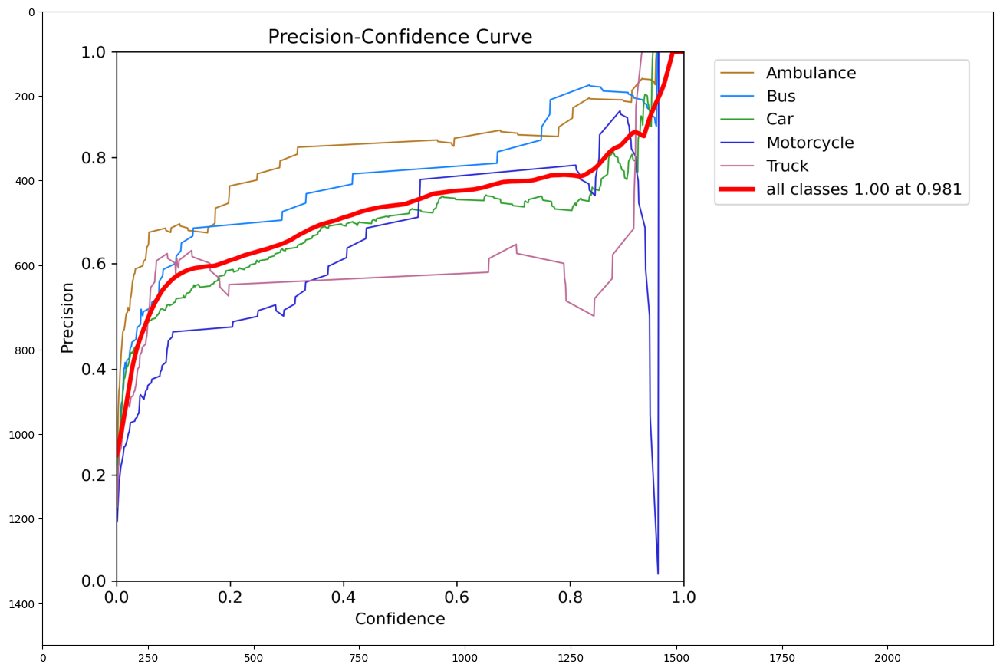

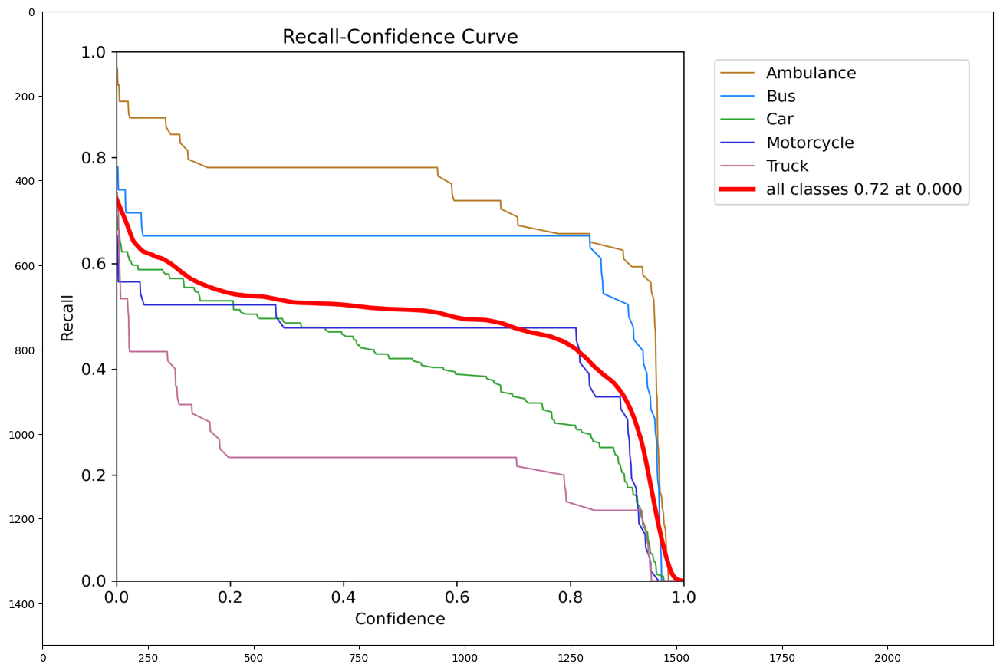

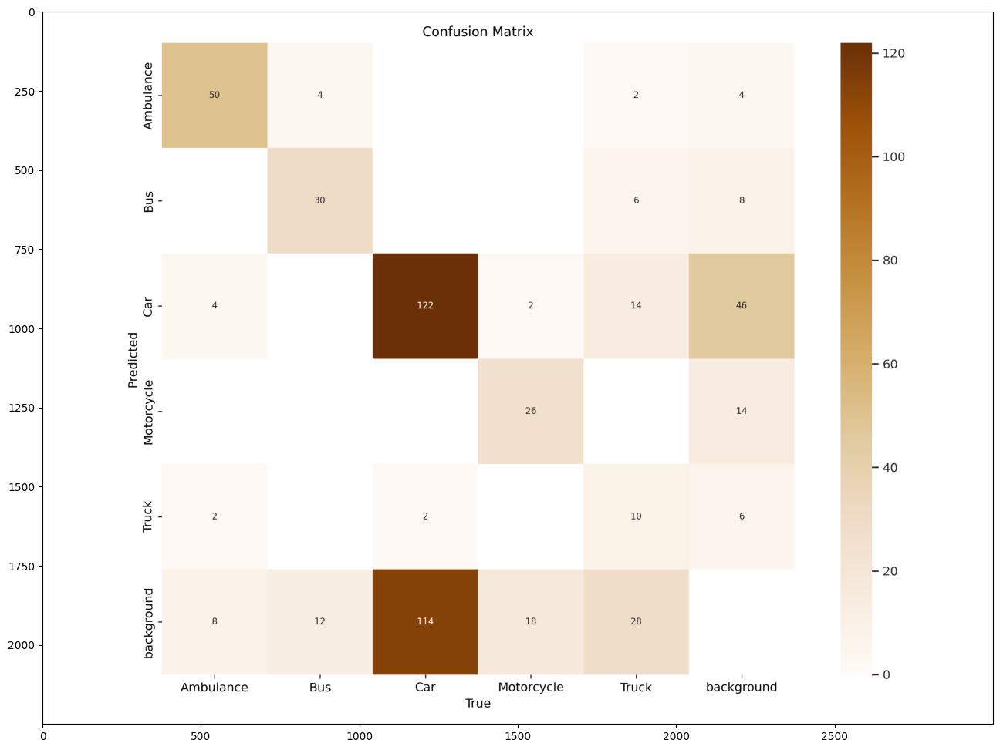

In [6]:
for i in list_of_metrics:
    image = cv2.imread(f'/kaggle/working/runs/detect/train/{i}')

    plt.figure(figsize=(16, 12))
    plt.imshow(image)
    plt.show()

In [7]:
result_model = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')

In [8]:
result_model

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,20.7820,1.02838,3.16176,1.37033,0.03380,0.85759,0.16655,0.11221,0.98418,3.76596,1.38198,0.000364,0.000364,0.000364
1,2,32.8350,1.21085,2.65485,1.48577,0.79139,0.06459,0.22267,0.12519,1.41549,3.39531,1.75131,0.000730,0.000730,0.000730
2,3,44.6152,1.23572,2.46920,1.50766,0.41682,0.19288,0.15227,0.08933,1.44532,3.10956,1.85192,0.001093,0.001093,0.001093
3,4,55.9589,1.28264,2.38063,1.51976,0.31092,0.23075,0.22486,0.14496,1.38596,2.89582,1.78367,0.001094,0.001094,0.001094
4,5,67.1603,1.20460,2.15049,1.46020,0.24213,0.33739,0.25610,0.15358,1.46218,2.67938,1.84905,0.001089,0.001089,0.001089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,196,2260.0500,0.32610,0.26923,0.88111,0.73926,0.50989,0.56366,0.42665,1.13415,1.60381,1.67273,0.000039,0.000039,0.000039
196,197,2270.8700,0.33126,0.28283,0.88888,0.71683,0.52351,0.56739,0.43114,1.12788,1.61259,1.66869,0.000033,0.000033,0.000033
197,198,2281.9600,0.31624,0.26267,0.88156,0.75810,0.50948,0.57259,0.43564,1.12305,1.61145,1.65627,0.000028,0.000028,0.000028
198,199,2292.8400,0.31713,0.25985,0.87475,0.76921,0.49673,0.57389,0.44010,1.12002,1.60953,1.64714,0.000022,0.000022,0.000022


In [9]:
valid_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

metrics = valid_model.val(split = 'test')

Ultralytics 8.3.13 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 186 layers, 2,685,343 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/labels... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<00:00, 259.47it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.26it/s]


                   all        126        258      0.835      0.633      0.716      0.545
             Ambulance         18         18      0.863          1      0.995      0.927
                   Bus         22         38      0.997      0.632       0.81      0.581
                   Car         60        150      0.663      0.587      0.634      0.422
            Motorcycle         12         32      0.788      0.312      0.433       0.26
                 Truck         14         20      0.863      0.632      0.707      0.533
Speed: 0.3ms preprocess, 4.9ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/val


In [10]:
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.8350451660716478
metrics/recall(B):  0.6325041458115727
metrics/mAP50(B):  0.7158367322609107
metrics/mAP50-95(B):  0.5445927013387333


In [11]:
image_dir = '/kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images'

image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]

random_images = random.sample(image_files, k=50)

for image_path in random_images:
    image = cv2.imread(image_path)
    results = model.predict([image], save=True, imgsz=416, conf=0.55, iou=0.85)


0: 416x416 1 Ambulance, 1 Motorcycle, 9.8ms
Speed: 4.2ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train2

0: 416x416 1 Car, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train3

0: 416x416 1 Car, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train4

0: 416x416 1 Car, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train5

0: 416x416 2 Buss, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train6

0: 416x416 1 Car, 7.6ms
Speed: 1.6ms preprocess, 7.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train7

0: 416x416 1 Ambulance, 1 Truck, 7.0

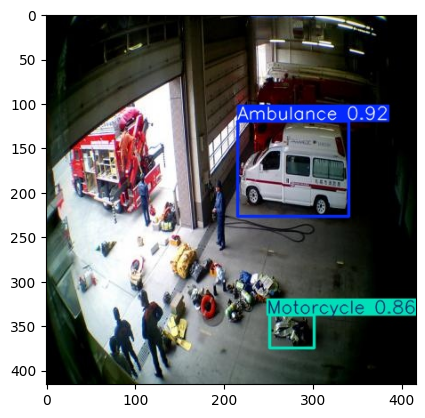

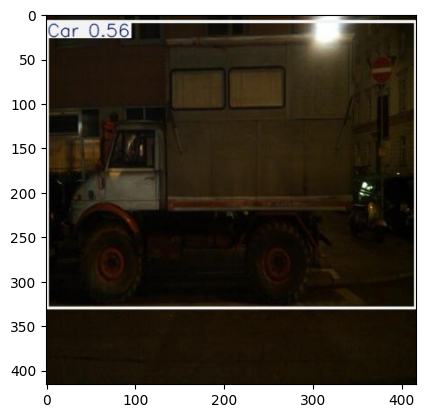

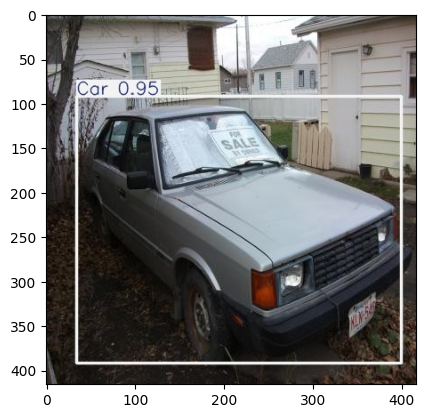

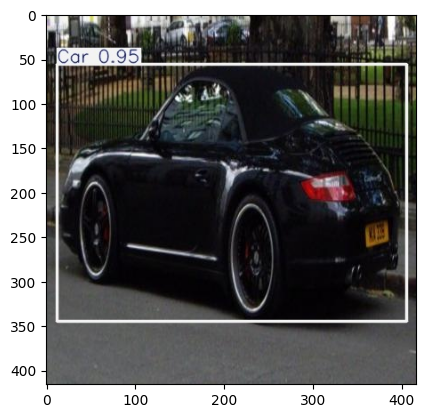

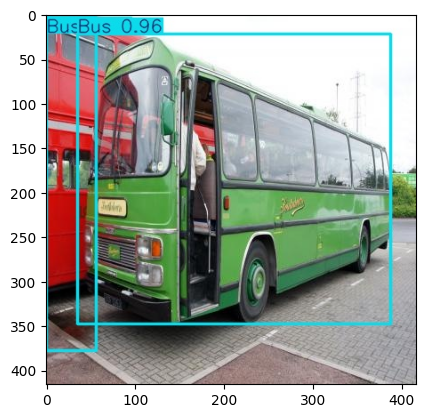

...

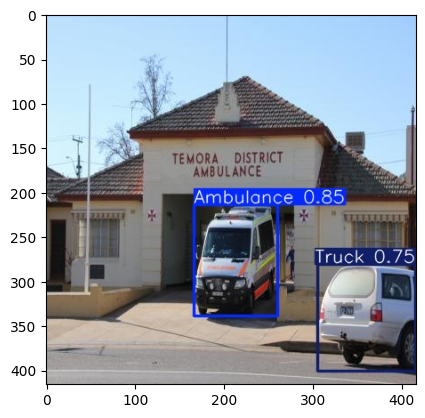

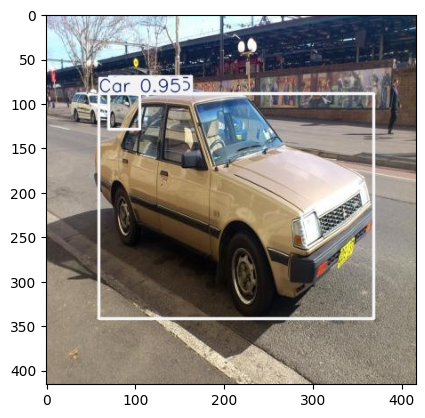

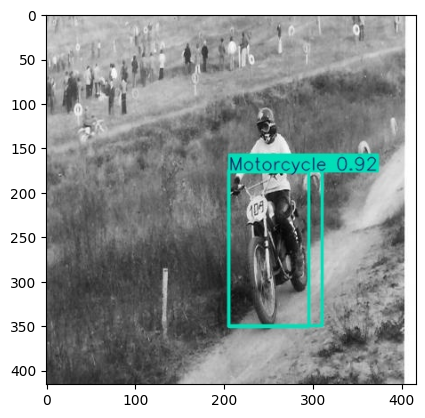

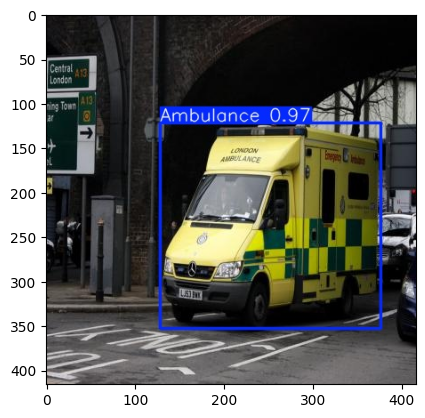

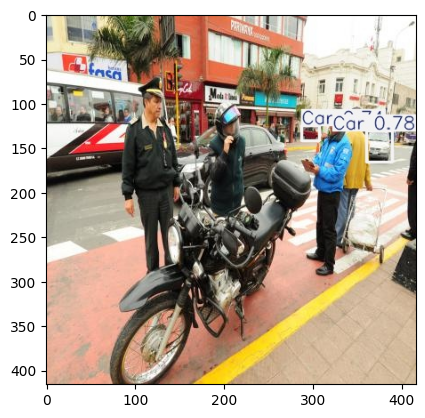

In [12]:
for i in range(2,52):
    plt.imshow(plt.imread(f'/kaggle/working/runs/detect/train{i}/image0.jpg'))
    plt.show()